<a href="https://colab.research.google.com/github/gnganesh99/NN_Error/blob/ayush_dev/notebooks/STM/stm_ms_acqfn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports and Functions

In [1]:
#Installs on colab
def running_on_colab():
    try:
        import google.colab  # type: ignore
        return True
    except ImportError:
        return False

if running_on_colab():
    print("Running on Colab. Installing dependencies...")
    !pip install -q atomai neuraloperator ipympl ipywidgets hoffmanstmpy

    from google.colab import output
    output.enable_custom_widget_manager()

    !git clone -b ayush_dev --single-branch https://github.com/gnganesh99/NN_Error.git
    %cd NN_Error

    print("Colab setup complete.")

Running on Colab. Installing dependencies...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 kB 10.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.0/179.0 kB 19.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 248.6/248.6 kB 29.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.0/519.0 kB 38.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.3/145.3 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 291.2/291.2 kB 28.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.1/118.1 kB 14.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 132.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.3/59.3 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 129.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.8/174.8 kB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
import sys
from pathlib import Path
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset
import os
from scipy.ndimage import zoom


try:
    get_ipython().run_line_magic("matplotlib", "widget")
except (ValueError, RuntimeError):
    get_ipython().run_line_magic("matplotlib", "inline")
import matplotlib.pyplot as plt


# Make package and notebook-local helper modules importable whether this starts in repo root or notebooks/
repo_root = Path.cwd() if (Path.cwd() / "src" / "nnerror").exists() else Path.cwd().parent.parent
src_root = str((repo_root / "src").resolve())
nb_root = str((repo_root / "notebooks"/"STM").resolve())
for import_root in (src_root, nb_root):
    if import_root not in sys.path:
        sys.path.insert(0, import_root)




from nnerror.networks import FNO_im2spec, CustomDecoder, im2spec, im2spec_attn
from nnerror.networks.custom_nn import CustomCNN
from nnerror.training_functions import err_estimation, train_model, predict_spectra, norm_0to1, predict_posterior, append_training_set
from nnerror.plot_functions import plot_only_training_loss, plot_training_loss, \
    plot_error_prediction, plot_spectra, plot_error_prediction_3d, plot_scale_slider, plot_latent_space, cluster_latent_space, plot_latent_distribution, plot_scale_specific_error_and_acquisition_maps
from nnerror.utils import append_multiscale_data, edges_zeroed_image, interpolated_center_crop, paired_images_spectra_1
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [3]:
from stm_utils import Sxm_Image
from CITS_Class import CITS_Analysis


In [4]:
class Norm_G:
    """Gaussian normalization using mean and standard deviation."""

    def __init__(self, data=None, mean=None, std=None, axis=0, eps=1e-8):
        self.data = data
        self.axis = axis
        self.eps = eps

        if data is not None:
            self.mean = np.mean(data, axis=axis, keepdims=True)
            self.std = np.std(data, axis=axis, keepdims=True)
        elif mean is not None and std is not None:
            self.mean = mean
            self.std = std
        else:
            raise ValueError("Either data or both mean and std must be provided.")

        self.std = np.where(self.std < eps, eps, self.std)

    def normalize(self, data=None):
        """Normalize data using stored mean and std."""
        if data is None:
            data = self.data
        return (data - self.mean) / self.std

    def denormalize(self, normalized_data):
        """Denormalize data using stored mean and std."""
        return normalized_data * self.std + self.mean


class Norm_0to1:
    """Normalization to the range [0, 1]."""

    def __init__(self, data=None, min_val=None, max_val=None, axis=0, eps=1e-8):
        self.data = data
        self.axis = axis
        self.eps = eps

        if data is not None:
            self.min_val = np.min(data, axis=axis, keepdims=True)
            self.max_val = np.max(data, axis=axis, keepdims=True)
        elif min_val is not None and max_val is not None:
            self.min_val = min_val
            self.max_val = max_val
        else:
            raise ValueError("Either data or both min_val and max_val must be provided.")

        self.data_range = np.where(
            (self.max_val - self.min_val) < eps,
            eps,
            self.max_val - self.min_val
        )

    def normalize(self, data=None):
        """Normalize data using stored min and max."""
        if data is None:
            if self.data is None:
                raise ValueError("No data provided to normalize.")
            data = self.data

        return (data - self.min_val) / self.data_range

    def denormalize(self, normalized_data):
        """Denormalize data using stored min and max."""
        return normalized_data * self.data_range + self.min_val

# Get data

In [5]:
data_folder = r"data/large_area" if not running_on_colab() else r"notebooks/STM/data/large_area"

img_sxm = os.path.join(data_folder, "EnZn2As2017.sxm")
spectra_sxm = os.path.join(data_folder, "EuZn2As2003.3ds")
#Get the morphology image
full_image = Sxm_Image(img_sxm).image()
full_image = norm_0to1(full_image)

#Get the current spectra
cits_obj = CITS_Analysis(spectra_sxm)
hyperspectra = cits_obj.current

full_image.shape, hyperspectra.shape

File import successful.


((512, 512), (80, 250, 121))

In [51]:
WS = 32
WS_init = 4
d_WS = 4
n_epochs_im2spec = 5
n_epochs_error = 5
error_type = "cos" # "L1", "L2", or "cos"
model_type = 'im2spec'
append_image_type = "pad" if model_type == 'im2spec' or 'im2spec_attn' or 'CustomCNN' else "interpolate" #pad, interpolate
use_swa = True
latent_dim = 5
last_swa_epochs = 100

(1024, 32, 32) (1024, 121) (1024, 2)
[30. 30.]


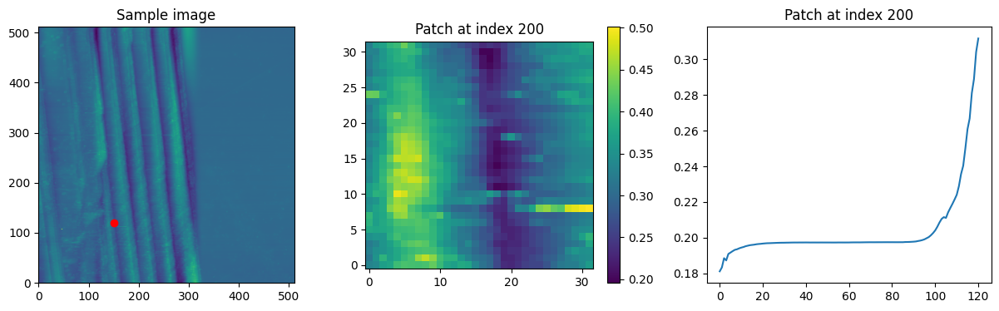

In [7]:


images, spectra, coordinates = paired_images_spectra_1(full_image, cits_obj, hyperspectra, window_size = WS,
                                                       coordinate_step = 15, image_norm=False, spectra_norm = False)

print(images.shape, spectra.shape, coordinates.shape)

print(coordinates[0])
fig, ax = plt.subplots(1, 3, figsize = (15, 4))


idx = 200

ax[0].imshow(full_image, origin = 'lower')
ax[0].scatter(coordinates[idx, 1], coordinates[idx, 0], c ="r")
ax[0].set_title("Sample image")


im = ax[1].imshow(images[idx], origin = 'lower')
fig.colorbar(im, ax=ax[1])
ax[1].set_title(f"Patch at index {idx}")
ax[2].plot(spectra[idx])
ax[2].set_title(f"Patch at index {idx}")

plt.show()

In [8]:
# coordinates are reversed.
swap_coordinates = coordinates.copy()
swap_coordinates = swap_coordinates[:, [1, 0]]
swap_coordinates.shape

(1024, 2)

In [9]:
images_all = images.copy()
spectra_all = spectra.copy()
swap_coordinates_all = swap_coordinates.copy()

# Initial checks (skip this if using active learning!)

## Train/test split

In [10]:
from sklearn.model_selection import train_test_split

images_train, images_test, spectra_train, spectra_test, s_coords_train, s_coords_test = train_test_split(
images_all, spectra_all, swap_coordinates_all, test_size = 0.2, random_state=42
)

initial_trainsize = images_train.shape[0]
print("images_train shape:", images_train.shape)
print("images_test shape:", images_test.shape)
print("spectra_train shape:", spectra_train.shape)
print("spectra_test shape:", spectra_test.shape)

images_train shape: (819, 32, 32)
images_test shape: (205, 32, 32)
spectra_train shape: (819, 121)
spectra_test shape: (205, 121)


## Augment across scales

In [11]:
images, spectra, scale_coordinates = append_multiscale_data(images_all, spectra_all, scales=np.arange(WS_init, WS, d_WS),
                                                            coordinates=swap_coordinates_all,
                                                            append_image_type=append_image_type)

Augmented images shape: (8192, 32, 32), Augmented spectra shape: (8192, 121), Augmented coordinates shape: (8192, 3)


In [12]:
images_tr_aug, spectra_tr_aug, _ = append_multiscale_data(images_train, spectra_train, scales=np.arange(WS_init, WS, d_WS),
                                                            coordinates=s_coords_train,
                                                            append_image_type=append_image_type)



images_test_aug, spectra_test_aug, _ = append_multiscale_data(images_test, spectra_test, scales=np.arange(WS_init, WS, d_WS),
                                                            coordinates=s_coords_test,
                                                            append_image_type=append_image_type)

print("images_train shape:", images_tr_aug.shape)
print("images_test shape:", images_test_aug.shape)

Augmented images shape: (6552, 32, 32), Augmented spectra shape: (6552, 121), Augmented coordinates shape: (6552, 3)
Augmented images shape: (1640, 32, 32), Augmented spectra shape: (1640, 121), Augmented coordinates shape: (1640, 3)
images_train shape: (6552, 32, 32)
images_test shape: (1640, 32, 32)


## Model dimensions

In [13]:

print("images shape:", images.shape)
print("spectra shape:", spectra.shape)
in_dim = images[0].shape  # Input dimensions (image height and width)
out_dim = len(spectra[0])  # Output dimensions (spectra length)
print("in_dim:", in_dim)


images shape: (8192, 32, 32)
spectra shape: (8192, 121)
in_dim: (32, 32)


## Train im2spec

### IM2SPEC model

In [14]:
# ----------------------------
# 2) Fit FNO_im2spec model
# ----------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

if model_type == 'FNO':

  # FNO_im2spec mode. Trains better with interpolation based augmentation.
  imspec_model = FNO_im2spec(
      target_size=out_dim,
      latent_dim=latent_dim,
      hidden_channels=32,
      n_modes=(16, 16),
      n_layers=4,
      use_swa = use_swa,
      last_swa_epochs = last_swa_epochs,
  ).to(device)

elif model_type == 'im2spec':
  # Use this normal im2spec. Augmentation by padding works better here.
  imspec_model = im2spec(feature_size=in_dim, target_size=out_dim, latent_dim=latent_dim).to(device)
elif model_type == 'im2spec_attn':
  imspec_model = im2spec_attn(feature_size=in_dim, target_size=out_dim, latent_dim=latent_dim).to(device)
elif model_type == 'CustomCNN':
  imspec_model = CustomCNN(input_channels=1, output_spectra_length=out_dim, latent_dim=latent_dim, img_size=in_dim).to(device)


else:
  raise ValueError(f"Unknown model type: {model_type}")

 50%|█████     | 101/200 [00:40<00:37,  2.66it/s, train_loss=0.0011, val_loss=0.0025]

SWA triggered at epoch 100


 56%|█████▋    | 113/200 [00:45<00:34,  2.50it/s, train_loss=0.0011, val_loss=0.0020]


Early stopping triggered after 10 epochs!


/usr/local/lib/python3.12/dist-packages/matplotlib/_fontconfig_pattern.py:85: PyparsingDeprecationWarning: 'parseString' deprecated - use 'parse_string'
  parse = parser.parseString(pattern)
/usr/local/lib/python3.12/dist-packages/matplotlib/_fontconfig_pattern.py:89: PyparsingDeprecationWarning: 'resetCache' deprecated - use 'reset_cache'
  parser.resetCache()
/usr/local/lib/python3.12/dist-packages/matplotlib/_mathtext.py:2010: PyparsingDeprecationWarning: 'oneOf' deprecated - use 'one_of'
  p.space          = oneOf(self._space_widths)("space")
/usr/local/lib/python3.12/dist-packages/matplotlib/_mathtext.py:2020: PyparsingDeprecationWarning: 'leaveWhitespace' deprecated - use 'leave_whitespace'
  )("sym").leaveWhitespace()
/usr/local/lib/python3.12/dist-packages/matplotlib/_mathtext.py:1984: PyparsingDeprecationWarning: 'setName' deprecated - use 'set_name'
  val.setName(key)
/usr/local/lib/python3.12/dist-packages/matplotlib/_mathtext.py:1987: PyparsingDeprecationWarning: 'setParseA

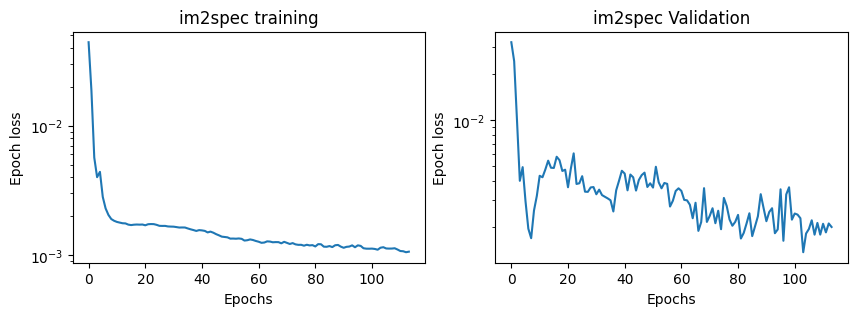

im2spec final train loss: 0.0010644239373505116
im2spec final internal val loss: 0.0020028823387942146
im2spec held-out test loss: 0.0016035476000979543


In [15]:


im2spec_training_dataset = TensorDataset(
    torch.tensor(images_tr_aug, dtype=torch.float32),
    torch.tensor(spectra_tr_aug, dtype=torch.float32),
)

im2spec_val_dataset = TensorDataset(
    torch.tensor(images_test_aug, dtype=torch.float32),
    torch.tensor(spectra_test_aug, dtype=torch.float32),
)

# train_model creates its own validation split from the dataset above.
# Keep images_test/spectra_test as an external held-out test set.

plot_im2spec_training = True

imspec_model, im2spec_train_loss, im2spec_val_loss = train_model(
    imspec_model,
    im2spec_training_dataset,
    n_batches=6,
    lr=1e-3,
    patience=10,
    n_epochs=n_epochs_im2spec,
    partial_train=False,
    val_dataset=im2spec_val_dataset,  # if not provided, train_model will split off its own validation set from the training dataset
    use_swa = True,
    last_swa_epochs = last_swa_epochs
)

if plot_im2spec_training:
    plot_only_training_loss([im2spec_train_loss], [im2spec_val_loss])

imspec_model.eval()
with torch.no_grad():
    x_test = torch.tensor(images_test, dtype=torch.float32, device=device)
    y_test = torch.tensor(spectra_test, dtype=torch.float32, device=device)
    test_pred = imspec_model.predict(x_test)
    im2spec_test_loss = torch.nn.functional.mse_loss(test_pred, y_test).item()

print("im2spec final train loss:", im2spec_train_loss[-1])
print("im2spec final internal val loss:", im2spec_val_loss[-1])
print("im2spec held-out test loss:", im2spec_test_loss)


## Estimate error

In [16]:
# ----------------------------
# 3) Build error targets using err_estimation
# ----------------------------
error_mean, error_std, error_vector = err_estimation(imspec_model, images_tr_aug, spectra_tr_aug, error_type=error_type)
error_targets = error_mean.astype(np.float32).reshape(-1, 1)
error_norm = Norm_0to1(data=error_targets)
normed_error_targets = error_norm.normalize()


print("error_mean shape:", error_mean.shape)
print("error_vector shape:", error_vector.shape)
print("error_targets shape:", error_targets.shape)


# ----------------------------
# 4) Fuse im2spec encoder with CustomDecoder
# ----------------------------
with torch.no_grad():
    latent_dim = imspec_model.encoder(torch.tensor(images[:1], dtype=torch.float32, device=device).unsqueeze(1)).shape[1]

error_model = CustomDecoder(encoder=imspec_model.encoder, embed_dim=latent_dim, target_size=1).to(device)

error_mean shape: (6552,)
error_vector shape: (6552, 1)
error_targets shape: (6552, 1)


## Train error model

 50%|█████     | 101/200 [00:28<00:27,  3.59it/s, train_loss=0.0009, val_loss=0.0010]

SWA triggered at epoch 100


 65%|██████▌   | 130/200 [00:37<00:20,  3.50it/s, train_loss=0.0012, val_loss=0.0009]
/tmp/ipykernel_10829/1515650117.py:29: UserWarning: Using a target size (torch.Size([6552])) that is different to the input size (torch.Size([1640, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  error_test_loss = torch.nn.functional.mse_loss(test_pred_error, y_test_error).item()


Early stopping triggered after 10 epochs!
error model final train loss: 0.0011857127039028065
error model final val loss: 0.000945683552085289
error model held-out test loss: 0.00099137332290411


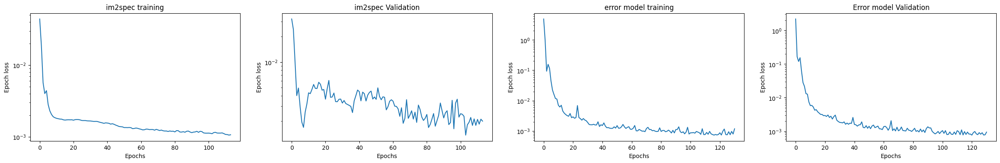

In [17]:

# ----------------------------
# 5) Train error model on images and estimated errors
# ----------------------------



error_training_dataset = TensorDataset(
    torch.tensor(images_tr_aug, dtype=torch.float32),
    torch.tensor(error_targets, dtype=torch.float32),
)


error_model, error_train_loss, error_val_loss = train_model(
    error_model,
    error_training_dataset,
    n_batches=6,
    lr=1e-3,
    patience=10,
    n_epochs=n_epochs_error,
    partial_train=True,
    use_swa = True,
    last_swa_epochs = last_swa_epochs
)
error_model.eval()
with torch.no_grad():
    x_test_error = torch.tensor(images_test_aug, dtype=torch.float32, device=device)
    y_test_error = torch.tensor(error_mean, dtype=torch.float32, device=device)
    test_pred_error = error_model.predict(x_test_error)
    error_test_loss = torch.nn.functional.mse_loss(test_pred_error, y_test_error).item()

print("error model final train loss:", error_train_loss[-1])
print("error model final val loss:", error_val_loss[-1])
print("error model held-out test loss:", error_test_loss)

plot_training_loss([im2spec_train_loss], [im2spec_val_loss], error_train_loss, error_val_loss)

## Predict all errors

In [18]:
#Predict errors on the entire dataset using the trained error model
predicted_errors = predict_spectra(error_model, images, ensemble=False)
predicted_errors = np.clip(predicted_errors, 0, None)
print("predicted_errors shape:", np.asarray(predicted_errors).shape)
print("predicted_errors range:", float(np.min(predicted_errors)), float(np.max(predicted_errors)))

predicted_errors shape: (8192,)
predicted_errors range: 0.0 0.10976791381835938


## Acquisition Function

In [19]:
import pandas as pd

# grouping
df_errors = pd.DataFrame({
    'x': scale_coordinates[:, 0],
    'y': scale_coordinates[:, 1],
    'scale': scale_coordinates[:, 2],
    'error': predicted_errors,
    'original_index': np.arange(len(predicted_errors)) # Store original indices
})

# x,y grouping by error
# idx min gets the index of the points with min error in the scale
# then get full row with x and y coords.
min_errors_df = df_errors.loc[df_errors.groupby(['x', 'y'])['error'].idxmin()].reset_index(drop=True)

# relevant columns, including the original_index for mapping back
min_errors_xy = min_errors_df[['x', 'y', 'scale','error', 'original_index']]

print("Minimum error for each (x, y) coordinate:")
display(min_errors_xy.head())

print("Shape of min_errors_xy (x, y, min_error, original_index):")
print(min_errors_xy.shape)

Minimum error for each (x, y) coordinate:


,x,y,scale,error,original_index
0,30.0,30.0,12.0,0.0,2048
1,30.0,45.0,12.0,0.0,2080
2,30.0,60.0,12.0,0.0,2112
3,30.0,75.0,12.0,0.0,2144
4,30.0,90.0,20.0,0.0,4224


Shape of min_errors_xy (x, y, min_error, original_index):
(1024, 5)


In [20]:
import numpy as np
from nnerror.training_functions import distance_acq_fn


plot_aq_ind, plot_aq_fn = distance_acq_fn(predicted_errors,
                                        beta=0,
                                        lambda_=1,
                                        sample_next_points=10,
                                        exclude_indices=[])

print("Shape of plot_aq_fn:", plot_aq_fn.shape)
print("Shape of plot_aq_ind:", plot_aq_ind.shape)

Shape of plot_aq_fn: (8192,)
Shape of plot_aq_ind: (10,)


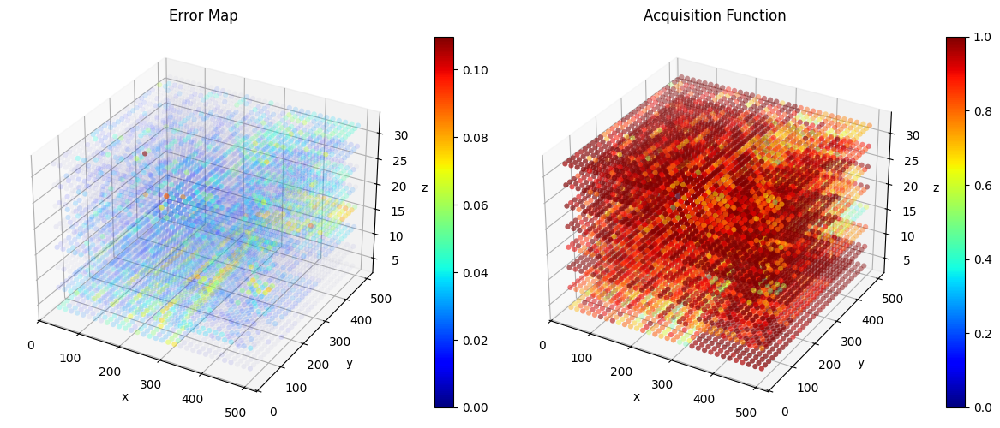

In [21]:
plot_error_prediction_3d(predicted_errors.reshape(-1,1), plot_aq_fn, scale_coordinates, plot_aq_ind, alpha_scale = True, colormap = 'jet')

In [22]:
# Calculate aq_fn for the entire dataset based on min_errors_xy
from nnerror.training_functions import distance_acq_fn

aq_ind, aq_fn = distance_acq_fn(min_errors_xy['error'].values,
                                beta=0,
                                lambda_=1,
                                sample_next_points=len(min_errors_xy), # Get values for all
                                exclude_indices=[])
print("Shape of aq_fn:", aq_fn.shape)


Shape of aq_fn: (1024,)


# Acquisiton function in the loop

In [23]:
def get_model(model_type, in_dim, out_dim, latent_dim = 3, device = None):
    # ----------------------------
    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    if model_type == "im2spec":
        model = im2spec(feature_size=in_dim, target_size=out_dim, latent_dim=latent_dim).to(device)

    elif model_type == "FNO":
        model = FNO_im2spec(
            target_size=out_dim,
            latent_dim=latent_dim,
            hidden_channels=32,
            n_modes=(16, 16),
            n_layers=4,
        ).to(device)

    elif model_type == "im2spec_attn":
        model = im2spec_attn(feature_size=in_dim, target_size=out_dim, latent_dim=latent_dim).to(device)
    elif model_type == "FNO_attn":
        model = FNO_im2spec_attn(
            target_size=out_dim,
            latent_dim=latent_dim,
            hidden_channels=32,
            n_modes=(16, 16),
            n_layers=4,
        ).to(device)

    else:
        raise ValueError(f"Unknown model type: {model_type}")

    return model

In [24]:
from nnerror.training_functions import distance_acq_fn, append_training_set, train_model, err_estimation, predict_spectra
from nnerror.plot_functions import plot_error_prediction, plot_spectra, plot_error_prediction_3d
from nnerror.networks import CustomDecoder # Assuming CustomDecoder is needed for error_model retraining
from sklearn.model_selection import train_test_split # Added import for train_test_split
import pandas as pd # Import pandas for DataFrame operations


In [47]:
WS = 32
WS_init = 4
d_WS = 4
n_epochs_im2spec = 200
n_epochs_error = 200
error_type = "L1" # "L1", "L2", or "cos"
model_type = 'im2spec'
append_image_type = "pad" if model_type == 'im2spec' or 'im2spec_attn' else "interpolate" #pad, interpolate
use_swa = True
latent_dim = 5
last_swa_epochs = 100

In [48]:

# initialize variables for the acquisition loop
acquisition_iterations = 20  # number of iterations
num_new_points = 10  # points per iteration
acqusition_method = "random"  # or "random"

In [56]:


#al denotes variables used for active learning


error_log = [] # reinitialize error_log for tracking

# # storing losses
# im2spec_al_train_losses = []
# im2spec_al_val_losses = []
# error_al_train_losses = []
# error_al_val_losses = []

# NEW: Variables to track test errors and train sizes for plotting error bars
im2spec_test_mismatches = []
pred_error_test = []
train_sizes = []


# NEW: Variables to track average errors for best correlated scales
best_correlated_errors = []
min_errors_xy_history = [] # New list to store min_errors_xy for each iteration

# original indices for the full dataset
original_indices = np.arange(len(images_all))

# #all available original indices
all_available_indices = min_errors_xy['original_index'].values

indices_train, indices_test = train_test_split(all_available_indices, train_size=0.1, random_state=42)

def augment_images_by_indices(indices, images, spectra):

    coordinates = None

    return images, spectra, coordinates

print("len(images):", len(images))
print("len(min_errors_xy):", len(min_errors_xy))
print("len(indices_train):", len(indices_train))
print("len(indices_test):", len(indices_test))


for i in range(acquisition_iterations):
    print(f"\nActive Learning Iteration {i+1}/{acquisition_iterations}")

    # # ensuring that the same point does not get selected
    # # filter out points whose original_index is already in current_indices_train
    available_min_errors_xy = min_errors_xy[~min_errors_xy['original_index'].isin(indices_train)]

    current_images_train, current_spectra_train, coordinates_train = augment_images_by_indices(indices_train, images, spectra)
    images_test_aug, spectra_test_aug, coordinates_test = augment_images_by_indices(indices_test, images, spectra)


    # ---------------- Datasets ----------------

    # recreate datasets
    im2spec_al_training_dataset = TensorDataset(
        torch.tensor(current_images_train, dtype=torch.float32),
        torch.tensor(current_spectra_train, dtype=torch.float32),
    )

    # validation dataset
    im2spec_al_val_dataset = TensorDataset(
        torch.tensor(images_test_aug, dtype=torch.float32),
        torch.tensor(spectra_test_aug, dtype=torch.float32),
    )


    # ------------------- IM2spec model training -------------------

    imspec_model = get_model(model_type, in_dim, out_dim, latent_dim=latent_dim, device=device)

    imspec_model, al_im2spec_train_loss, al_im2spec_val_loss = train_model(
        imspec_model,
        im2spec_al_training_dataset,
        n_batches=6,
        lr=1e-3,
        patience= 10,
        n_epochs=n_epochs_im2spec // 5, #reduced epochs for faster retraining
        partial_train=False,
        val_dataset=im2spec_al_val_dataset,
        use_swa=True,
        last_swa_epochs = 0.1
    )


    # ------------------------- Error model training -------------------------

    # estimate errors again with the appended dataset
    error_mean_al, _, _ = err_estimation(imspec_model, current_images_train, current_spectra_train, error_type=error_type)
    error_targets_al = error_mean_al.astype(np.float32).reshape(-1, 1)

    # retrain and reinitialize error model
    with torch.no_grad():
        latent_dim = imspec_model.encoder(torch.tensor(images[:1], dtype=torch.float32, device=device).unsqueeze(1)).shape[1]
    error_model = CustomDecoder(encoder=imspec_model.encoder, embed_dim=latent_dim, target_size=1).to(device)

    error_al_training_dataset = TensorDataset(
        torch.tensor(current_images_train, dtype=torch.float32),
        torch.tensor(error_targets_al, dtype=torch.float32),
    )


    error_model, al_error_train_loss, al_error_val_loss = train_model(
        error_model,
        error_al_training_dataset,
        n_batches=6,
        lr=1e-3,
        patience=5,
        n_epochs=n_epochs_error // 5,
        partial_train=True,
        val_dataset=  None, # error_al_val_dataset,
        use_swa=True,
        last_swa_epochs = 0.1
    )



    # ------------- Test set evaluation for error model and im2spec model --------------

    # test set errors to evaluate error model
    error_mean_test_al, _, _ = err_estimation(imspec_model, images_test_aug, spectra_test_aug, error_type=error_type)
    error_targets_test_al = error_mean_test_al.astype(np.float32).reshape(-1, 1)
    im2spec_test_mismatches.append(error_mean_test_al.flatten())

    # Re-predict errors on the entire dataset with the newly trained error_model
    predicted_errors_test = predict_spectra(error_model, images_test_aug, ensemble=False)
    predicted_errors_test = np.clip(predicted_errors_test, 0, None) # Clip negative errors
    pred_error_test.append(predicted_errors_test.flatten())



    # Re-predict errors on the entire dataset with the newly trained error_model
    predicted_errors_current_iter = predict_spectra(error_model, images, ensemble=False)
    predicted_errors_current_iter = np.clip(predicted_errors_current_iter, 0, None) # Clip negative errors





    # Re-create df_errors for the current iteration
    df_errors_current_iter = pd.DataFrame({
        'x': scale_coordinates[:, 0],
        'y': scale_coordinates[:, 1],
        'scale': scale_coordinates[:, 2],
        'error': predicted_errors_current_iter,
        'original_index': np.arange(len(predicted_errors_current_iter))
    })

    # Re-find min_errors_xy for the current iteration
    min_errors_xy_current_iter = df_errors_current_iter.loc[df_errors_current_iter.groupby(['x', 'y'])['error'].idxmin()].reset_index(drop=True) #indices


    if acqusition_method == "distance":

        aq_ind, aq_vals = distance_acq_fn(
            available_min_errors_xy['error'].values,
            beta=1,
            lambda_=1,
            sample_next_points=num_new_points,
            exclude_indices=[]
        )

        # convert local indices back to original dataset indices
        new_indices = available_min_errors_xy.iloc[aq_ind]["original_index"].values

    elif acqusition_method == "random":

        new_indices = np.random.choice(
            indices_test,
            size=num_new_points,
            replace=False
        )

    # update train/test splits
    indices_train = np.concatenate([indices_train, new_indices])

    indices_test = indices_test[
        ~np.isin(indices_test, new_indices)
    ]
    train_sizes.append(len(indices_train))
    print(f"Train indices set size: {len(indices_train)}, Test indices set size: {len(indices_test)}")

    # Calculate the mean and std of these minimum errors and append to history
    best_errors_clipped = np.clip(min_errors_xy_current_iter['error'].values, 0, None)
    best_correlated_errors.append(best_errors_clipped)
    min_errors_xy_history.append(min_errors_xy_current_iter) # Store the current map

len(images): 8192
len(min_errors_xy): 1024
len(indices_train): 102
len(indices_test): 922

Active Learning Iteration 1/20


100%|██████████| 1/1 [00:00<00:00,  1.60it/s, train_loss=0.0344, val_loss=0.0227]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.86it/s, train_loss=0.9214, val_loss=0.2817]

SWA triggered at epoch 0


Train indices set size: 112, Test indices set size: 912

Active Learning Iteration 2/20


100%|██████████| 1/1 [00:00<00:00,  1.65it/s, train_loss=0.0395, val_loss=0.0279]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.87it/s, train_loss=0.0549, val_loss=0.0395]

SWA triggered at epoch 0


Train indices set size: 122, Test indices set size: 902

Active Learning Iteration 3/20


100%|██████████| 1/1 [00:00<00:00,  1.66it/s, train_loss=0.0391, val_loss=0.0299]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.86it/s, train_loss=0.0940, val_loss=0.0236]

SWA triggered at epoch 0


Train indices set size: 132, Test indices set size: 892

Active Learning Iteration 4/20


100%|██████████| 1/1 [00:00<00:00,  1.65it/s, train_loss=0.0414, val_loss=0.0246]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.86it/s, train_loss=5.5132, val_loss=2.2216]

SWA triggered at epoch 0


Train indices set size: 142, Test indices set size: 882

Active Learning Iteration 5/20


100%|██████████| 1/1 [00:00<00:00,  1.67it/s, train_loss=0.0383, val_loss=0.0309]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.86it/s, train_loss=0.0918, val_loss=0.0084]

SWA triggered at epoch 0


Train indices set size: 152, Test indices set size: 872

Active Learning Iteration 6/20


100%|██████████| 1/1 [00:00<00:00,  1.64it/s, train_loss=0.0341, val_loss=0.0266]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.88it/s, train_loss=0.0842, val_loss=0.0181]

SWA triggered at epoch 0


Train indices set size: 162, Test indices set size: 862

Active Learning Iteration 7/20


100%|██████████| 1/1 [00:00<00:00,  1.66it/s, train_loss=0.0379, val_loss=0.0242]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.89it/s, train_loss=3.3522, val_loss=0.8128]

SWA triggered at epoch 0


Train indices set size: 172, Test indices set size: 852

Active Learning Iteration 8/20


100%|██████████| 1/1 [00:00<00:00,  1.66it/s, train_loss=0.0361, val_loss=0.0217]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.89it/s, train_loss=0.3332, val_loss=0.2596]

SWA triggered at epoch 0


Train indices set size: 182, Test indices set size: 842

Active Learning Iteration 9/20


100%|██████████| 1/1 [00:00<00:00,  1.66it/s, train_loss=0.0344, val_loss=0.0213]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.88it/s, train_loss=0.0365, val_loss=0.0155]

SWA triggered at epoch 0


Train indices set size: 192, Test indices set size: 832

Active Learning Iteration 10/20


100%|██████████| 1/1 [00:00<00:00,  1.65it/s, train_loss=0.0345, val_loss=0.0312]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  1.49it/s, train_loss=0.2889, val_loss=0.0654]

SWA triggered at epoch 0


Train indices set size: 202, Test indices set size: 822

Active Learning Iteration 11/20


100%|██████████| 1/1 [00:00<00:00,  1.64it/s, train_loss=0.0316, val_loss=0.0259]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.87it/s, train_loss=0.0059, val_loss=0.0010]

SWA triggered at epoch 0


Train indices set size: 212, Test indices set size: 812

Active Learning Iteration 12/20


100%|██████████| 1/1 [00:00<00:00,  1.66it/s, train_loss=0.0426, val_loss=0.0353]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.89it/s, train_loss=0.0771, val_loss=0.0241]

SWA triggered at epoch 0


Train indices set size: 222, Test indices set size: 802

Active Learning Iteration 13/20


100%|██████████| 1/1 [00:00<00:00,  1.66it/s, train_loss=0.0362, val_loss=0.0276]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.89it/s, train_loss=0.1735, val_loss=0.0225]

SWA triggered at epoch 0


Train indices set size: 232, Test indices set size: 792

Active Learning Iteration 14/20


100%|██████████| 1/1 [00:00<00:00,  1.66it/s, train_loss=0.0385, val_loss=0.0275]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.89it/s, train_loss=0.0647, val_loss=0.0170]

SWA triggered at epoch 0


Train indices set size: 242, Test indices set size: 782

Active Learning Iteration 15/20


100%|██████████| 1/1 [00:00<00:00,  1.66it/s, train_loss=0.0379, val_loss=0.0331]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.88it/s, train_loss=0.1601, val_loss=0.0955]

SWA triggered at epoch 0


Train indices set size: 252, Test indices set size: 772

Active Learning Iteration 16/20


100%|██████████| 1/1 [00:00<00:00,  1.67it/s, train_loss=0.0400, val_loss=0.0328]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.88it/s, train_loss=0.0291, val_loss=0.0179]

SWA triggered at epoch 0


Train indices set size: 262, Test indices set size: 762

Active Learning Iteration 17/20


100%|██████████| 1/1 [00:00<00:00,  1.64it/s, train_loss=0.0355, val_loss=0.0275]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  1.45it/s, train_loss=0.2013, val_loss=0.0641]

SWA triggered at epoch 0


Train indices set size: 272, Test indices set size: 752

Active Learning Iteration 18/20


100%|██████████| 1/1 [00:00<00:00,  1.64it/s, train_loss=0.0363, val_loss=0.0280]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.85it/s, train_loss=0.0380, val_loss=0.0041]

SWA triggered at epoch 0


Train indices set size: 282, Test indices set size: 742

Active Learning Iteration 19/20


100%|██████████| 1/1 [00:00<00:00,  1.66it/s, train_loss=0.0411, val_loss=0.0331]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.88it/s, train_loss=0.1062, val_loss=0.0366]

SWA triggered at epoch 0


Train indices set size: 292, Test indices set size: 732

Active Learning Iteration 20/20


100%|██████████| 1/1 [00:00<00:00,  1.66it/s, train_loss=0.0377, val_loss=0.0308]

SWA triggered at epoch 0



100%|██████████| 1/1 [00:00<00:00,  2.88it/s, train_loss=0.0323, val_loss=0.0074]

SWA triggered at epoch 0


Train indices set size: 302, Test indices set size: 722


len(x): 20
len(mean_im2spec_test_errors): 20
len(std_im2spec_test_errors): 20
len(mean_pred_test_errors): 20
len(std_pred_test_errors): 20
[112 122 132 142 152 162 172 182 192 202 212 222 232 242 252 262 272 282
 292 302]


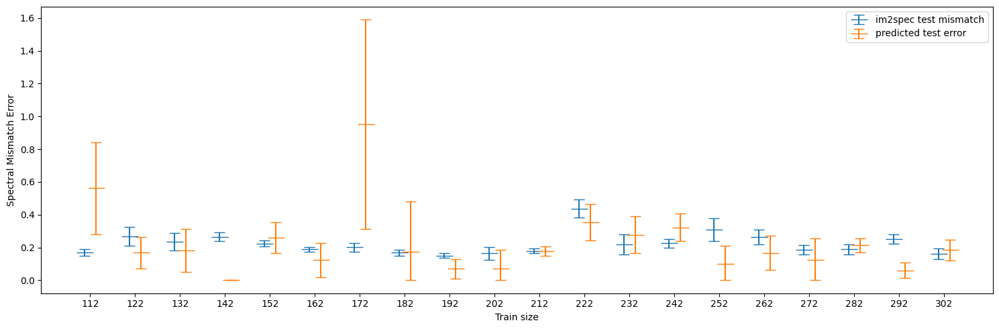

In [57]:
import numpy as np
import matplotlib.pyplot as plt
import torch


def to_numpy(data):
    if isinstance(data, torch.Tensor):
        return data.cpu().numpy()
    return data

# Mean and standard deviation of im2spec test losses
mean_im2spec_test_errors = [np.mean(np.clip(to_numpy(errors), 0, None)) for errors in im2spec_test_mismatches]
std_im2spec_test_errors = [np.std(np.clip(to_numpy(errors), 0, None)) for errors in im2spec_test_mismatches]

# Mean and standard deviation of predicted test errors
mean_pred_error_test = [np.mean(np.clip(to_numpy(errors), 0, None)) for errors in pred_error_test]
std_pred_error_test = [np.std(np.clip(to_numpy(errors), 0, None)) for errors in pred_error_test]

# clip error bars
yerr_im2spec_lower = [mean_val - np.maximum(0, mean_val - std_val) for mean_val, std_val in zip(mean_im2spec_test_errors, std_im2spec_test_errors)]
yerr_im2spec_upper = list(std_im2spec_test_errors)
yerr_im2spec = np.array([yerr_im2spec_lower, yerr_im2spec_upper])

yerr_pred_lower = [mean_val - np.maximum(0, mean_val - std_val) for mean_val, std_val in zip(mean_pred_error_test, std_pred_error_test)]
yerr_pred_upper = list(std_pred_error_test)
yerr_pred = np.array([yerr_pred_lower, yerr_pred_upper])

x = np.array(train_sizes)
offset = 1.25

plt.figure(figsize=(15, 5))

print("len(x):", len(x))
print("len(mean_im2spec_test_errors):", len(mean_im2spec_test_errors))
print("len(std_im2spec_test_errors):", len(std_im2spec_test_errors))

print("len(mean_pred_test_errors):", len(mean_pred_error_test))
print("len(std_pred_test_errors):", len(std_pred_error_test))

print(x)

# im2spec test mismatch
plt.errorbar(
    x - offset,
    mean_im2spec_test_errors,
    yerr=yerr_im2spec,
    fmt="_",
    markersize=18,
    capsize=6,
    linestyle="none",
    label="im2spec test mismatch",
)

# predicted test error
plt.errorbar(
    x + offset,
    mean_pred_error_test,
    yerr=yerr_pred,
    fmt="_",
    markersize=18,
    capsize=6,
    linestyle="none",
    label="predicted test error",
)

plt.xlabel("Train size")
plt.ylabel("Spectral Mismatch Error")
plt.xticks(x)
plt.legend()
plt.tight_layout()
plt.show()

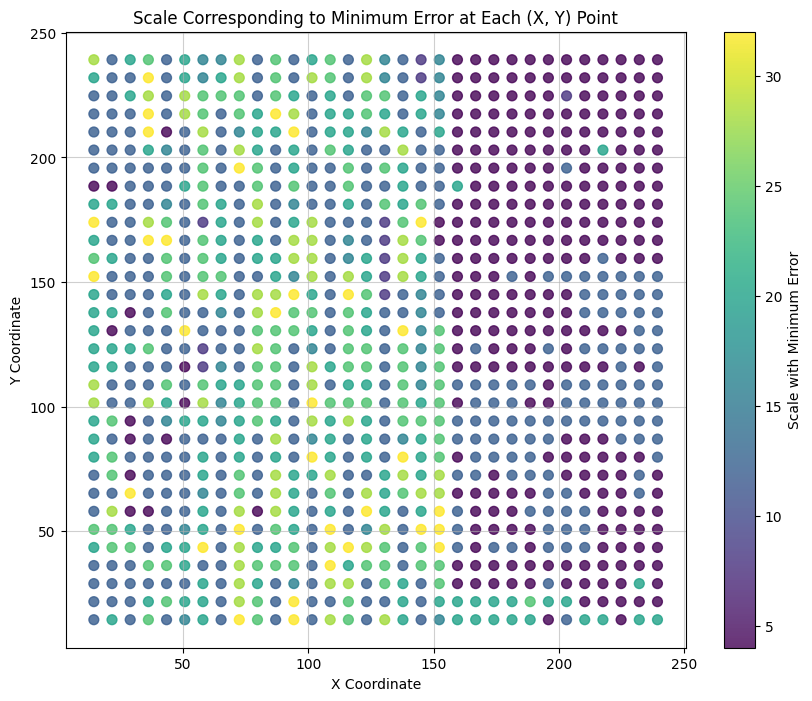

In [58]:

# Visualize the scales corresponding to the minimum error for each (x, y) point
fig, ax = plt.subplots(figsize=(10, 8))
scatter = ax.scatter(min_errors_xy['x']*0.4833, min_errors_xy['y']*0.4833, c=min_errors_xy['scale'], cmap='viridis', s=50, alpha=0.8)
cbar = fig.colorbar(scatter)
cbar.set_label('Scale with Minimum Error')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_title('Scale Corresponding to Minimum Error at Each (X, Y) Point')
plt.grid(True, alpha=0.6)
plt.show()

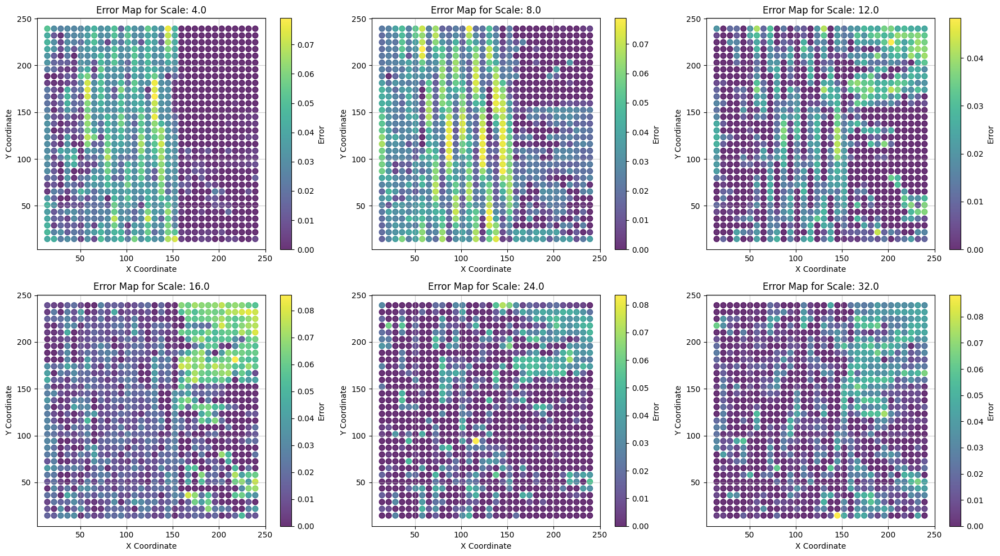

In [59]:
unique_scales = df_errors['scale'].unique()
unique_scales.sort()

# desired scales for plotting
scales_to_plot = [4.0, 8.0, 12.0, 16.0, 24.0, 32.0]


scales_to_plot = [s for s in scales_to_plot if s in unique_scales]


n_scales = len(scales_to_plot)
n_cols = 3
n_rows = int(np.ceil(n_scales / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 6, n_rows * 5), squeeze=False)
axes = axes.flatten()

for i, scale in enumerate(scales_to_plot):
    ax = axes[i]
    scale_data = df_errors[df_errors['scale'] == scale]
    scatter = ax.scatter(scale_data['x']*0.4833, scale_data['y']*0.4833, c=scale_data['error'], cmap='viridis', s=50, alpha=0.8)
    fig.colorbar(scatter, ax=ax, label='Error')
    ax.set_title(f'Error Map for Scale: {scale}')
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    ax.grid(True, alpha=0.6)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

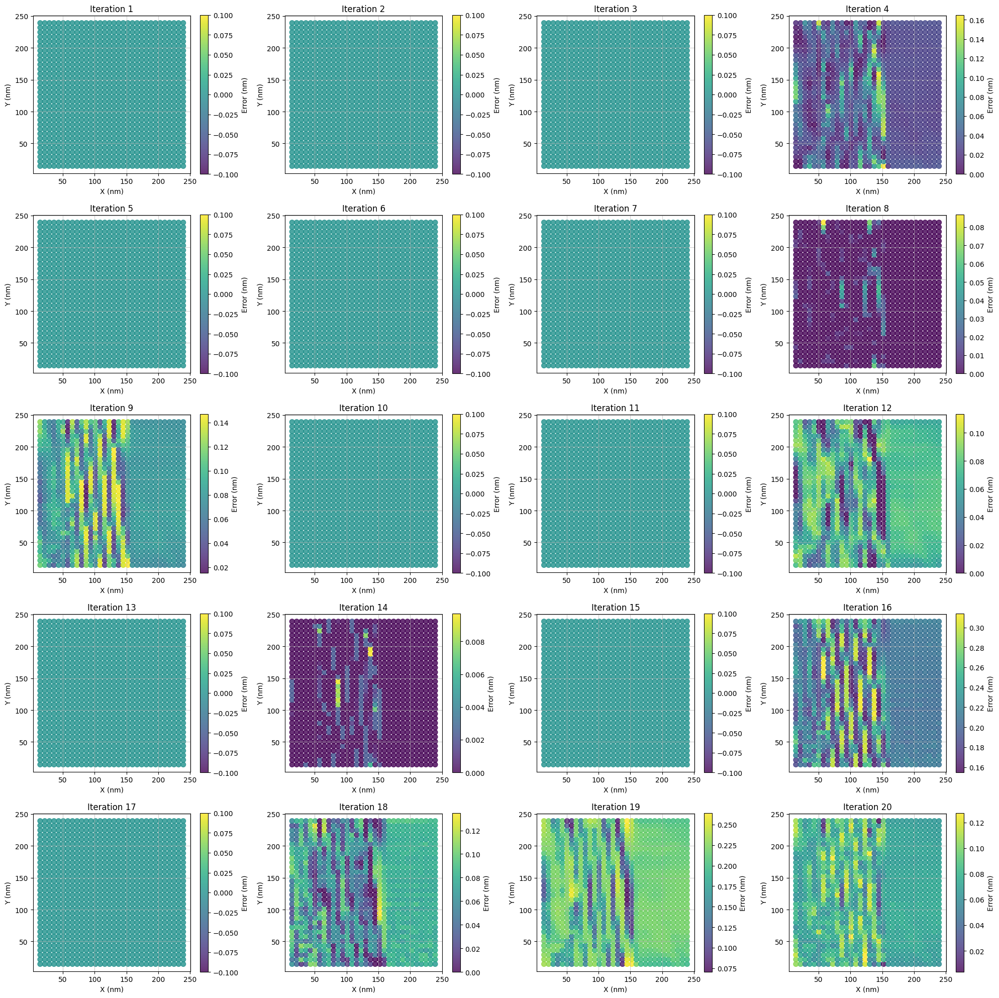

In [44]:
import matplotlib.pyplot as plt
import numpy as np



n_iterations = len(min_errors_xy_history)
n_cols = 4
n_rows = int(np.ceil(n_iterations / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4), squeeze=False)
axes = axes.flatten()

scaling_factor = 0.4833

for i, min_errors_df_iter in enumerate(min_errors_xy_history):
    ax = axes[i]
    # clip negative values
    errors_clipped = np.clip(min_errors_df_iter['error'], 0, None)
    scatter = ax.scatter(
        min_errors_df_iter['x'] * scaling_factor,
        min_errors_df_iter['y'] * scaling_factor,
        c=errors_clipped,
        cmap='viridis',
        s=50,
        alpha=0.8
    )

    cbar = fig.colorbar(scatter, ax=ax)
    cbar.set_label('Error (nm)')

    ax.set_title(f'Iteration {i+1}')
    ax.set_xlabel('X (nm)')
    ax.set_ylabel('Y (nm)')
    ax.grid(True, alpha=0.6)
    ax.set_aspect('equal', adjustable='box') # Maintain aspect ratio

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

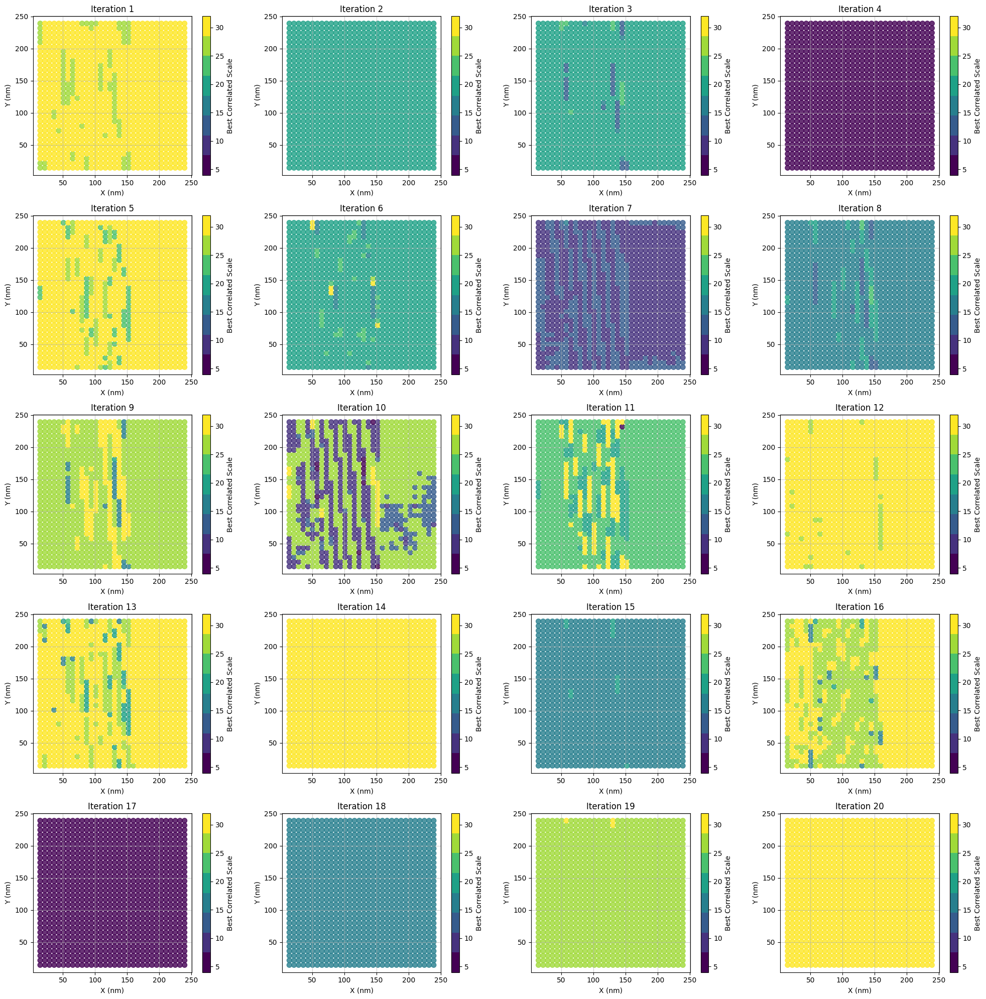

In [60]:
import matplotlib.pyplot as plt
import numpy as np

n_iterations = len(min_errors_xy_history)
n_cols = 4
n_rows = int(np.ceil(n_iterations / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4), squeeze=False)
axes = axes.flatten()

scaling_factor = 0.4833

#unique scales
all_scales = np.concatenate([df_iter['scale'].unique() for df_iter in min_errors_xy_history])
unique_scales = np.sort(np.unique(all_scales))

# color bar for consistency
cmap = plt.get_cmap('viridis', len(unique_scales))
scale_to_color = {scale: cmap(i) for i, scale in enumerate(unique_scales)}

for i, min_errors_df_iter in enumerate(min_errors_xy_history):
    ax = axes[i]

    # Map scale values to consistent colors
    colors = [scale_to_color[s] for s in min_errors_df_iter['scale']]

    scatter = ax.scatter(
        min_errors_df_iter['x'] * scaling_factor,
        min_errors_df_iter['y'] * scaling_factor,
        c=colors,
        s=50,
        alpha=0.8
    )
    # colorbar for consistency
    norm = plt.Normalize(vmin=unique_scales.min(), vmax=unique_scales.max())
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array(unique_scales)
    cbar = fig.colorbar(sm, ax=ax)
    cbar.set_label('Best Correlated Scale') # Corrected label

    ax.set_title(f'Iteration {i+1}')
    ax.set_xlabel('X (nm)')
    ax.set_ylabel('Y (nm)')
    ax.grid(True, alpha=0.6)
    ax.set_aspect('equal', adjustable='box') # Maintain aspect ratio

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [61]:
# # random acquisiton

# import random

# # initialize variables
# acquisition_iterations_random = acquisition_iterations
# num_new_points_random = num_new_points

# # storing losses for random acquisition
# im2spec_random_train_losses = []
# im2spec_random_val_losses = []
# error_random_train_losses = []
# error_random_val_losses = []

# # error plotting
# im2spec_test_mismatches_random = []
# pred_error_test_random = []
# train_sizes_random = []

# # track errors
# mean_best_correlated_errors_history_random = []
# std_best_correlated_errors_history_random = []
# min_errors_xy_history_random = []


# # initialize indices array
# current_images_train_random = np.empty((0, images.shape[1], images.shape[2]), dtype=images.dtype)
# current_spectra_train_random = np.empty((0, spectra.shape[1]), dtype=spectra.dtype)
# current_indices_train_random = np.empty((0,), dtype=np.int64)

# # test train split
# initial_train_indices_random, _ = train_test_split(
#     all_available_indices, test_size=0.9, random_state=42
# )

# for next_index in initial_train_indices_random:
#     current_images_train_random, current_spectra_train_random, current_indices_train_random = append_training_set(
#         images, spectra, next_index, current_images_train_random, current_spectra_train_random, current_indices_train_random
#     )

# # append points in train set before acquisition
# train_sizes_random.append(len(current_images_train_random))

# # test mismatches
# imspec_model.eval()
# with torch.no_grad():
#     _, _, initial_im2spec_errors_random = err_estimation(imspec_model, images_test_aug, spectra_test_aug, error_type=error_type)
#     im2spec_test_mismatches_random.append(initial_im2spec_errors_random.flatten())

# # predicted test errors
# error_model.eval()
# with torch.no_grad():
#     x_test_error_pred_initial_random = torch.tensor(images_test_aug, dtype=torch.float32, device=device)
#     initial_predicted_errors_on_test_random = error_model.predict(x_test_error_pred_initial_random)
#     pred_error_test_random.append(initial_predicted_errors_on_test_random.flatten())

# # mean and std dev
# # error pred
# predicted_errors_initial_random = predict_spectra(error_model, images, ensemble=False)
# predicted_errors_initial_random = np.clip(predicted_errors_initial_random, 0, None) # Clip negative errors

# # re create data frame
# df_errors_initial_random = pd.DataFrame({
#     'x': scale_coordinates[:, 0],
#     'y': scale_coordinates[:, 1],
#     'scale': scale_coordinates[:, 2],
#     'error': predicted_errors_initial_random,
#     'original_index': np.arange(len(predicted_errors_initial_random))
# })

# # finding min errors
# min_errors_xy_initial_random = df_errors_initial_random.loc[df_errors_initial_random.groupby(['x', 'y'])['error'].idxmin()].reset_index(drop=True)

# # mean and std of errors to append
# mean_best_correlated_errors_history_random.append(np.mean(min_errors_xy_initial_random['error'].values))
# std_best_correlated_errors_history_random.append(np.std(min_errors_xy_initial_random['error'].values))
# min_errors_xy_history_random.append(min_errors_xy_initial_random) # Store the initial map


# # random acquisition Loop
# for i in range(acquisition_iterations_random):
#     print(f"\nRandom Acquisition Iteration {i+1}/{acquisition_iterations_random}")

#     # filter out points whose original_index is already in current_indices_train_random
#     available_min_errors_xy_random = min_errors_xy[~min_errors_xy['original_index'].isin(current_indices_train_random)]

#     if len(available_min_errors_xy_random) == 0:
#         print(f"No more points to acquire randomly after {i} iterations.")
#         break

#     # randomly select new points

#     if len(available_min_errors_xy_random) < num_new_points_random:
#         num_to_sample = len(available_min_errors_xy_random)
#     else:
#         num_to_sample = num_new_points_random

#     random_indices_in_df = random.sample(range(len(available_min_errors_xy_random)), num_to_sample)
#     newly_acquired_original_indices_random = available_min_errors_xy_random.iloc[random_indices_in_df]['original_index'].values


#     for next_index in newly_acquired_original_indices_random:
#         current_images_train_random, current_spectra_train_random, current_indices_train_random = append_training_set(
#             images, spectra, next_index, current_images_train_random, current_spectra_train_random, current_indices_train_random
#         )

#     # add to training set after iteration
#     train_sizes_random.append(len(current_images_train_random))

#     # recreate datasets
#     im2spec_random_training_dataset = TensorDataset(
#         torch.tensor(current_images_train_random, dtype=torch.float32),
#         torch.tensor(current_spectra_train_random, dtype=torch.float32),
#     )

#     # validation dataset
#     im2spec_random_val_dataset = TensorDataset(
#         torch.tensor(images_test_aug, dtype=torch.float32),
#         torch.tensor(spectra_test_aug, dtype=torch.float32),
#     )

#     # retrain imspec_model
#     if model_type == 'FNO':
#         imspec_model_random = FNO_im2spec(
#             target_size=out_dim,
#             latent_dim=latent_dim,
#             hidden_channels=32,
#             n_modes=(16, 16),
#             n_layers=4,
#         ).to(device)
#     elif model_type == 'im2spec':
#         imspec_model_random = im2spec(feature_size=in_dim, target_size=out_dim, latent_dim=latent_dim).to(device)
#     elif model_type == 'im2spec_attn':
#         imspec_model_random = im2spec_attn(feature_size=in_dim, target_size=out_dim, latent_dim=latent_dim).to(device)
#     elif model_type == 'CustomCNN':
#           imspec_model_random = CustomCNN(input_channels=1, output_spectra_length=out_dim, latent_dim=latent_dim, img_size=in_dim).to(device)
#     else:
#         raise ValueError(f"Unknown model type: {model_type}")

#     imspec_model_random, random_im2spec_train_loss, random_im2spec_val_loss = train_model(
#         imspec_model_random,
#         im2spec_random_training_dataset,
#         n_batches=6,
#         lr=1e-3,
#         patience=10,
#         n_epochs=n_epochs_im2spec // 5,
#         partial_train=False,
#         val_dataset=im2spec_random_val_dataset,
#         use_swa=True,
#         last_swa_epochs = 0.1
#     )
#     im2spec_random_train_losses.append(random_im2spec_train_loss[-1])
#     im2spec_random_val_losses.append(random_im2spec_val_loss[-1])

#     # store mismatches for each iteration
#     imspec_model_random.eval()
#     with torch.no_grad():
#         _, _, im2spec_iteration_errors_random = err_estimation(imspec_model_random, images_test_aug, spectra_test_aug, error_type=error_type)
#         im2spec_test_mismatches_random.append(im2spec_iteration_errors_random.flatten())

#     # estimate errors again with the appended dataset
#     error_mean_random_al, _, _ = err_estimation(imspec_model_random, current_images_train_random, current_spectra_train_random, error_type=error_type)
#     error_targets_random_al = error_mean_random_al.astype(np.float32).reshape(-1, 1)

#     # retrain and reinitialize error model
#     with torch.no_grad():
#         latent_dim_random = imspec_model_random.encoder(torch.tensor(images[:1], dtype=torch.float32, device=device).unsqueeze(1)).shape[1]
#     error_model_random = CustomDecoder(encoder=imspec_model_random.encoder, embed_dim=latent_dim_random, target_size=1).to(device)

#     error_random_training_dataset = TensorDataset(
#         torch.tensor(current_images_train_random, dtype=torch.float32),
#         torch.tensor(error_targets_random_al, dtype=torch.float32),
#     )

#     # test set errors to evaluate error model
#     error_mean_test_random_al, _, _ = err_estimation(imspec_model_random, images_test_aug, spectra_test_aug, error_type=error_type)
#     error_targets_test_random_al = error_mean_test_random_al.astype(np.float32).reshape(-1, 1)

#     error_random_val_dataset = TensorDataset(
#         torch.tensor(images_test_aug, dtype=torch.float32),
#         torch.tensor(error_targets_test_random_al, dtype=torch.float32),
#     )

#     error_model_random, random_error_train_loss, random_error_val_loss = train_model(
#         error_model_random,
#         error_random_training_dataset,
#         n_batches=6,
#         lr=1e-3,
#         patience=5,
#         n_epochs=n_epochs_error // 5,
#         partial_train=True,
#         val_dataset=error_random_val_dataset,
#         use_swa=True,
#         last_swa_epochs = 0.1
#     )
#     error_random_train_losses.append(random_error_train_loss[-1])
#     error_random_val_losses.append(random_error_val_loss[-1])

#     # error model errors per iteration
#     error_model_random.eval()
#     with torch.no_grad():
#         x_test_error_pred_iter_random = torch.tensor(images_test_aug, dtype=torch.float32, device=device)
#         predicted_errors_on_test_iter_random = error_model_random.predict(x_test_error_pred_iter_random)
#         pred_error_test_random.append(predicted_errors_on_test_iter_random.flatten())


#     predicted_errors_current_iter_random = predict_spectra(error_model_random, images, ensemble=False)
#     predicted_errors_current_iter_random = np.clip(predicted_errors_current_iter_random, 0, None) # Clip negative errors


#     df_errors_current_iter_random = pd.DataFrame({
#         'x': scale_coordinates[:, 0],
#         'y': scale_coordinates[:, 1],
#         'scale': scale_coordinates[:, 2],
#         'error': predicted_errors_current_iter_random,
#         'original_index': np.arange(len(predicted_errors_current_iter_random))
#     })


#     min_errors_xy_current_iter_random = df_errors_current_iter_random.loc[df_errors_current_iter_random.groupby(['x', 'y'])['error'].idxmin()].reset_index(drop=True)

#     # append mean and std dev to training history
#     best_errors_clipped_random = np.clip(min_errors_xy_current_iter_random['error'].values, 0, None)
#     mean_best_correlated_errors_history_random.append(np.mean(best_errors_clipped_random))
#     std_best_correlated_errors_history_random.append(np.std(best_errors_clipped_random))
#     min_errors_xy_history_random.append(min_errors_xy_current_iter_random) # Store the current map


### Comparison of Active Learning vs. Random Acquisition

In [63]:
# Mean and standard deviation of best correlated errors for Random Acquisition
mean_best_correlated_errors_random = np.array(mean_best_correlated_errors_history_random)
std_best_correlated_errors_random = np.array(std_best_correlated_errors_history_random)

# Clip error bars if the lower bound goes below zero for Random Acquisition
yerr_random_lower = mean_best_correlated_errors_random - np.maximum(0, mean_best_correlated_errors_random - std_best_correlated_errors_random)
yerr_random_upper = std_best_correlated_errors_random
yerr_best_correlated_random = np.array([yerr_random_lower, yerr_random_upper])


x_random = np.array(train_sizes_random)

plt.figure(figsize=(12, 7))

# Active Learning Plot
plt.errorbar(
    x - offset,
    mean_best_correlated_errors_history,
    yerr=yerr_best_correlated,
    fmt="_",
    capsize=5,
    label="Mean Best Correlated Error (Active Learning)",
    color='blue'
)

# Random Acquisition Plot
plt.errorbar(
    x_random + offset,
    mean_best_correlated_errors_random,
    yerr=yerr_best_correlated_random,
    fmt="_",
    capsize=5,
    label="Mean Best Correlated Error (Random Acquisition)",
    color='red'
)

plt.xlabel("Number of Acquired Points")
plt.ylabel("Mean Best Correlated Error")
plt.title("Comparison of Mean Best Correlated Error: Active Learning vs. Random Acquisition")
plt.xticks(x)
plt.legend()
plt.tight_layout()
plt.show()

NameError: name 'mean_best_correlated_errors_history_random' is not defined